# Lung Auscultation Classifier

[Lung Auscultation](https://my.clevelandclinic.org/health/diagnostics/23080-auscultation) is a clinical procedure where a healthcare professional listens to the sounds of the lungs using a stethoscope. This method is crucial for diagnosing respiratory conditions like pneumonia, asthma, chronic obstructive pulmonary disease (COPD), and lung infections. By listening to breath sounds, such as wheezing, crackles, or reduced breath sounds, healthcare practicioners can identify abnormalities in lung function. This model aims to aid in the accurate and efficient diagnosis of common lung conditions from patient ausculation recordings. Specifically, the lung conditions this model aims to classify between are: [Chronic obstructive pulmonary disease(COPD)](https://www.who.int/news-room/fact-sheets/detail/chronic-obstructive-pulmonary-disease-(copd)#:~:text=Chronic%20obstructive%20pulmonary%20disease%20(COPD)%20is%20a%20common%20lung%20disease,damaged%20or%20clogged%20with%20phlegm.), [Pneumonia](https://www.mayoclinic.org/diseases-conditions/pneumonia/symptoms-causes/syc-20354204#:~:text=Pneumonia%20is%20an%20infection%20that,and%20fungi%2C%20can%20cause%20pneumonia.), [Upper respiratory tract infection(URTI)](https://my.clevelandclinic.org/health/articles/4022-upper-respiratory-infection), and [Bronchiolitis](https://medlineplus.gov/ency/article/000975.htm).

The [Respiratory Sound Database](https://www.kaggle.com/datasets/vbookshelf/respiratory-sound-database) contains 920 audio recordings (.wav) taken from a diverse group of 126 hospital patients as well as annotations providing the diagnosis of each patient. It covers a total of 5.5 hours of lung sounds and 6898 respiratory cycles. 

In [6]:
import os
import wave
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from IPython.display import Audio
import librosa
import librosa.display

### Data Loading

In [8]:
audio_data = 'audio_and_txt_files/'

920 .wav patient recordings and corresponding .txt files for annotation.

In [10]:
patient_data = pd.read_csv('patient_diagnosis.csv', names = ['patient_id', 'disease'])

In [11]:
patient_data

,patient_id,disease
0,101,URTI
1,102,Healthy
2,103,Asthma
3,104,COPD
4,105,URTI
...,...,...
121,222,COPD
122,223,COPD
123,224,Healthy
124,225,Healthy


Note that while there are 920 ausculation audio samples, there are only 126 patients. This is because multiple recordings were taken for each patient.

### Data Visualization

In [14]:
print(patient_data.disease.value_counts())

COPD              64
Healthy           26
URTI              14
Bronchiectasis     7
Pneumonia          6
Bronchiolitis      6
LRTI               2
Asthma             1
Name: disease, dtype: int64


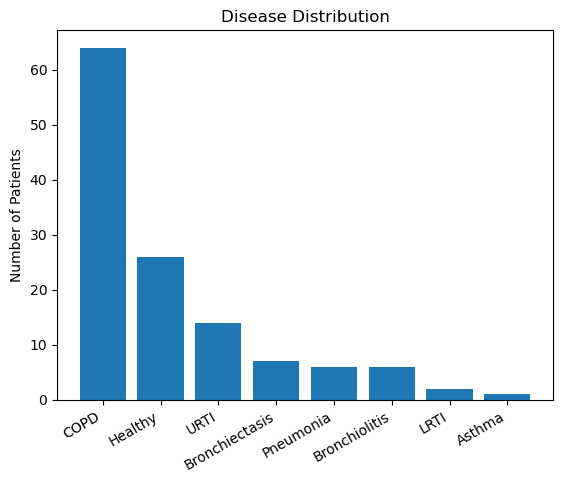

In [15]:
fig, ax = plt.subplots()
class_names=['COPD', 'Healthy', 'URTI', 'Bronchiectasis', 'Pneumonia', 'Bronchiolitis', 'LRTI', 'Asthma']
counts = patient_data.disease.value_counts()
ax.bar(class_names, counts, label=class_names)
ax.set_ylabel('Number of Patients')
ax.set_title('Disease Distribution')
plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

This dataset is highly unbalanced. COPD patients dominate the data, while LRTI and Asthma patients are extremelt underrepresented. This will be addressed during feature extraction.

In [17]:
audio_files = [s.split('.')[0] for s in os.listdir(audio_data) if '.txt' in s]

In [18]:
example_audio_files = audio_files[:3]

In [19]:
Audio('audio_and_txt_files/' + audio_files[0] + '.wav')

In [20]:
Audio('audio_and_txt_files/' + audio_files[1] + '.wav')

In [21]:
Audio('audio_and_txt_files/' + audio_files[2] + '.wav')

Librosa is a python package specifically designed for audio analysis, allowing for signal processing, feature extraction, visuzalization of the audio, and much more. Here, the package is being used to manipulate the example audio files and produce waveform displays for them.

There are a number of signal processing transformations being applied to the audio examples here:

Adding Noise: Adds Gaussian noise to the amplitude of the original signal in order to simulate a noisy environment and make the data less clean.

Time Shifting: The entire audio signal is shifted in time by rolling the entire array by a certain number of positions.

Time Stretching: The speed of the audio is altered without changing the pitch.

Pitch Shifting: The pitch of the audio is altered without changing the speed.

The objective of applying these transformations is to augment and diversify the dataset and to allow for more robust and resilient model training.

Lastly, the various transformations for all three of the example audio samples are displayed through waveform graphs.

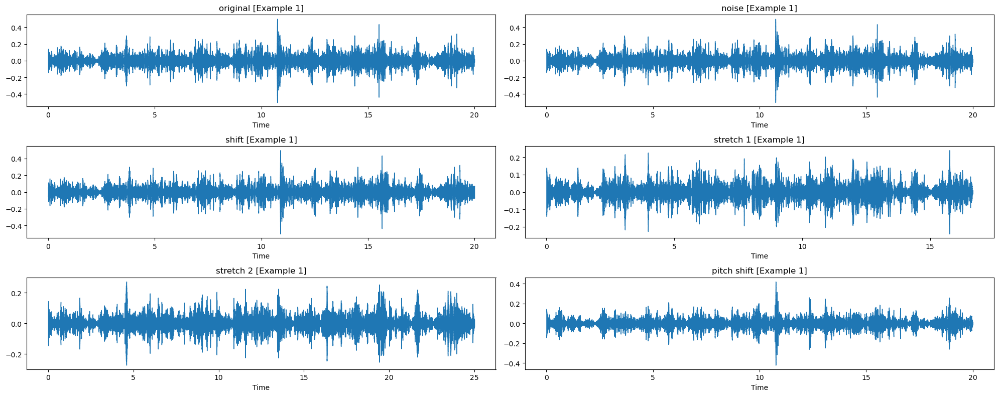

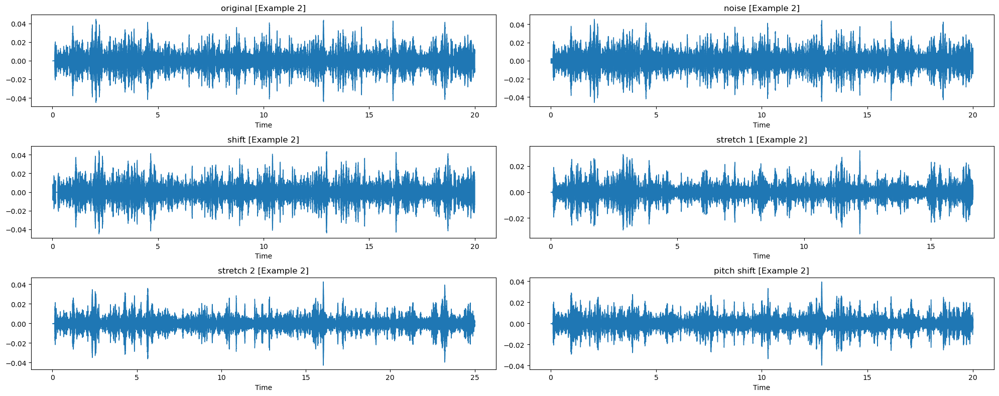

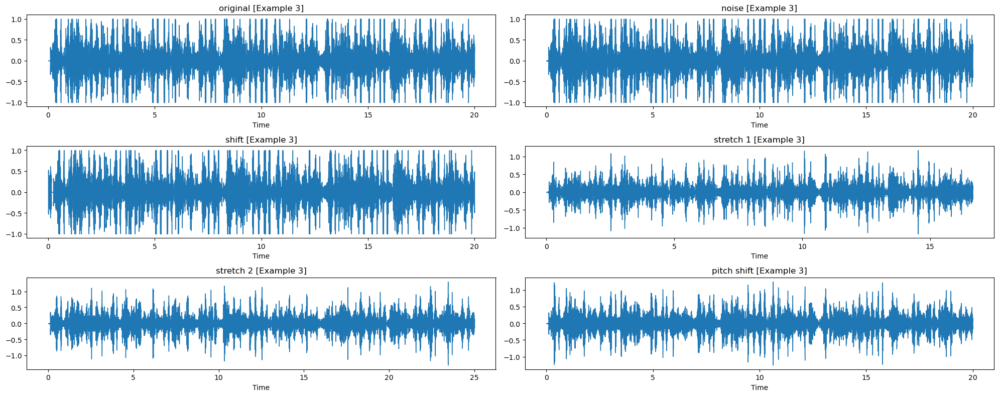

In [30]:
for audio_file in example_audio_files:
    example_count=example_audio_files.index(audio_file)+1
    audio_file = 'audio_and_txt_files/' + audio_file + '.wav'
    y, sr = librosa.load(audio_file)
    y_noise = y + 0.0008 * np.random.randn(len(y))
    y_shift = np.roll(y, 3200)
    y_stretch_1 = librosa.effects.time_stretch(y, rate=1.2)
    y_stretch_2 = librosa.effects.time_stretch(y, rate=0.8)
    y_pitch_shift = librosa.effects.pitch_shift(y, sr=sr, n_steps=3)
    plt.figure(figsize=(20, 8))
        
    plt.subplot(3,2,1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('original [Example ' + str(example_count) + ']')

    plt.subplot(3,2,2)
    librosa.display.waveshow(y_noise, sr=sr)
    plt.title('noise [Example ' + str(example_count) + ']')

    plt.subplot(3,2,3)
    librosa.display.waveshow(y_shift, sr=sr)
    plt.title('shift [Example ' + str(example_count) + ']')
    
    plt.subplot(3,2,4)
    librosa.display.waveshow(y_stretch_1, sr=sr)
    plt.title('stretch 1 [Example ' + str(example_count) + ']')
    
    plt.subplot(3,2,5)
    librosa.display.waveshow(y_stretch_2, sr=sr)
    plt.title('stretch 2 [Example ' + str(example_count) + ']')
    
    plt.subplot(3,2,6)
    librosa.display.waveshow(y_pitch_shift, sr=sr)
    plt.title('pitch shift [Example ' + str(example_count) + ']')
    
    plt.tight_layout()

Here, the same signal processing transformations are applied to the samples, but now, MFCCs are extracted from the original and transformed data signals before they are displayed.

Mel-frequency ceptral coefficients(MFCCs) are the spectral characteristics of sound converted through a series of transformations into features that are suitable for training machine learning models.

Here, 50 MFCCs are extracted from each sample as well as from every sample transformed through signal processing. 

Lastly, each version of each audio sample is displayed as a spectrogram, allowing for a visual representation of the spectrum of frequencies in each sound signal as they vary over time.

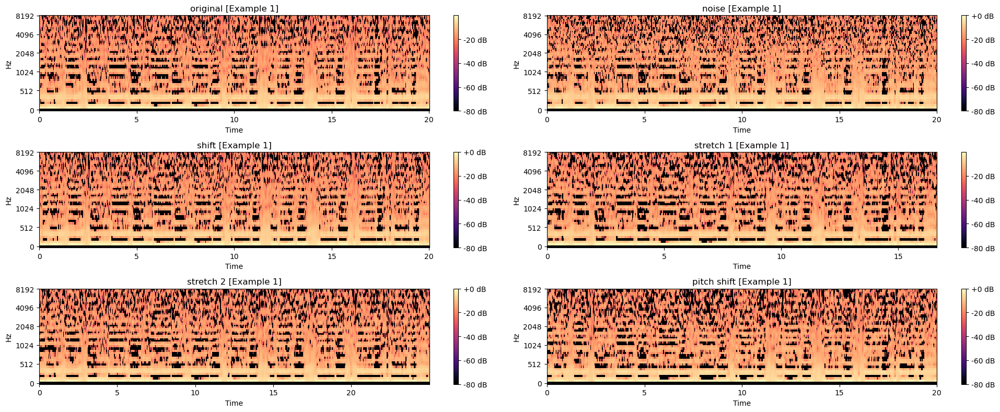

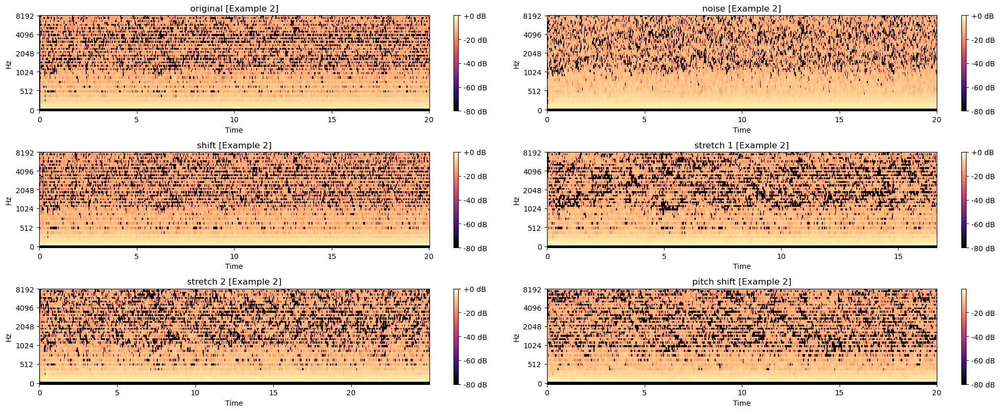

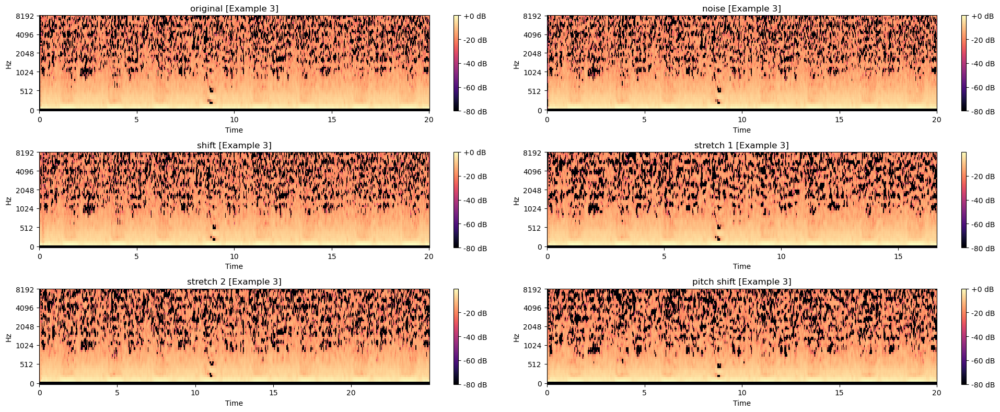

In [43]:
for audio_file in example_audio_files:
    example_count=example_audio_files.index(audio_file)+1
    audio_file = 'audio_and_txt_files/' + audio_file + '.wav'
    y, sr = librosa.load(audio_file)
    y_noise = y + 0.0008 * np.random.randn(len(y))
    y_shift = np.roll(y, 3200)
    y_stretch_1 = librosa.effects.time_stretch(y, rate=1.2)
    y_stretch_2 = librosa.effects.time_stretch(y, rate=0.8)
    y_pitch_shift = librosa.effects.pitch_shift(y, sr=sr, n_steps=3)
    y = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=50)
    y_noise = librosa.feature.mfcc(y=y_noise, sr=sr, n_mfcc=50)
    y_shift = librosa.feature.mfcc(y=y_shift, sr=sr, n_mfcc=50)
    y_stretch_1 = librosa.feature.mfcc(y=y_stretch_1, sr=sr, n_mfcc=50)
    y_stretch_2 = librosa.feature.mfcc(y=y_stretch_2, sr=sr, n_mfcc=50)
    y_pitch_shift = librosa.feature.mfcc(y=y_pitch_shift, sr=sr, n_mfcc=50)
    plt.figure(figsize=(20, 8))
    
    plt.subplot(3,2,1)
    librosa.display.specshow(librosa.power_to_db(y,ref=np.max),
                             y_axis='mel',
                             fmax=8000,
                             x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('original [Example ' + str(example_count) + ']')

    plt.subplot(3,2,2)
    librosa.display.specshow(librosa.power_to_db(y_noise,ref=np.max),
                             y_axis='mel',
                             fmax=8000,
                             x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('noise [Example ' + str(example_count) + ']')

    plt.subplot(3,2,3)
    librosa.display.specshow(librosa.power_to_db(y_shift,ref=np.max),
                             y_axis='mel',
                             fmax=8000,
                             x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('shift [Example ' + str(example_count) + ']')
    
    plt.subplot(3,2,4)
    librosa.display.specshow(librosa.power_to_db(y_stretch_1,ref=np.max),
                             y_axis='mel',
                             fmax=8000,
                             x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('stretch 1 [Example ' + str(example_count) + ']')
    
    plt.subplot(3,2,5)
    librosa.display.specshow(librosa.power_to_db(y_stretch_2,ref=np.max),
                             y_axis='mel',
                             fmax=8000,
                             x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('stretch 2 [Example ' + str(example_count) + ']')
    
    plt.subplot(3,2,6)
    librosa.display.specshow(librosa.power_to_db(y_pitch_shift,ref=np.max),
                             y_axis='mel',
                             fmax=8000,
                             x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('pitch shift [Example ' + str(example_count) + ']')

    plt.tight_layout()

### Data Engineering

The augment_audio function applies the signal processing transformations mentioned above (Adding Gaussian noise, Time shifting, Time-Stretching, and Pitch shifting) on an audio sample before extracting and returning the array of MFCC features for every augmented version of the original signal. 

In [49]:
def augment_audio(data_x, sampling_rate, features):
    
    augmentations = [
        data_x,
        data_x + 0.001 * np.random.randn(len(data_x)),
        np.roll(data_x, 1600), 
        librosa.effects.time_stretch(data_x, rate=1.2), 
        librosa.effects.time_stretch(data_x, rate=0.8),  
        librosa.effects.pitch_shift(data_x, sr=sampling_rate, n_steps=3)  
    ]
    
    mfcc_features = [np.mean(librosa.feature.mfcc(y=aug, sr=sampling_rate, n_mfcc=features).T, axis=0) for aug in augmentations]
    
    return mfcc_features

The mfccs_feature_extraction function iterates through every audio file in the dataset and calls the augment_audio function on it in order to apply signal processing transformations to it and to extract its MFCC features.

The function also limits the number of features extracted from COPD patients in order to combat overrepresentation of COPD in the dataset. Additionally, the LRTI and Asthma categories are excluded due to their insufficient representation, which was too little for any statistically meaningful results. 

In [52]:
def mfccs_feature_extraction(dir_, diagnosis_df, features=52):
    
    X, y = [], []
    copd_count = 0
    
    for sound_file in os.listdir(dir_):
        if not (sound_file.endswith('.wav') and sound_file[:3] not in {'103', '108', '115'}):
            continue
        
        patient_id = int(sound_file[:3])
        disease = diagnosis_df.loc[diagnosis_df['patient_id'] == patient_id, 'disease'].values[0]
        
        if disease == 'COPD':
                if copd_count >= 37:
                    continue
                else: 
                    copd_count += 1
        
        audio_path = os.path.join(dir_, sound_file)
        data_x, sampling_rate = librosa.load(audio_path, res_type='kaiser_fast')
        mfcc_features = augment_audio(data_x, sampling_rate, features)
        
        label = 'Bronchiolitis' if disease in {'Bronchiectasis', 'Bronchiolitis'} else disease
        X.extend(mfcc_features)
        y.extend([label] * len(mfcc_features))
        
    return np.array(X), np.array(y)

The function returns two NumPy arrays: one containing the MFCC features and one containing the corresponding labels.

In [54]:
x_mfccs, y = mfccs_feature_extraction(audio_data, patient_data)

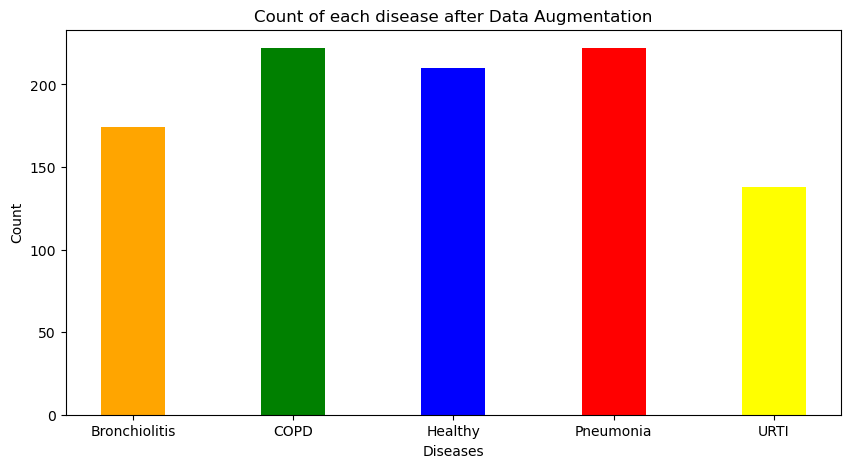

In [55]:
unique, counts = np.unique(y, return_counts=True)
data_count = dict(zip(unique, counts))

data = data_count

courses = list(data.keys())
values = list(data.values())

fig = plt.figure(figsize = (10, 5))

plt.bar(courses, values, color =['orange','green','blue','red','yellow','black'],
        width = 0.4)

plt.xlabel("Diseases")
plt.ylabel("Count")
plt.title("Count of each disease after Data Augmentation")
plt.show()

The dataset has now been balanced and augmented, allowing for efficient training, for model robustness, and for the minimization of overfitting.

In [57]:
label_to_onehot = {
    'COPD': [1, 0, 0, 0, 0],
    'Bronchiolitis': [0, 1, 0, 0, 0],
    'Pneumonia': [0, 0, 1, 0, 0],
    'URTI': [0, 0, 0, 1, 0],
    'Healthy': [0, 0, 0, 0, 1]
}

Y_data = np.array([label_to_onehot[label] for label in y]).astype('float64')

In [58]:
mfccs_features = np.array(x_mfccs)
lables = np.array(Y_data)

One Hot Encoding: Here, the technique of one hot encoding is employed to the represent categorical features as numerical features, allowing for uniform numerical input into the machine learning model.

### Model Building

In [61]:
from sklearn.model_selection import train_test_split

In [66]:
mfcc_train, mfcc_val, lables_train, lables_val  = train_test_split(mfccs_features, lables, test_size=0.175)
mfcc_train, mfcc_test, lables_train, lables_test = train_test_split(mfcc_train, lables_train, test_size=0.075)

Divides the data into 3 subsets:

Training set - used to train the model

Validation set - intermediary set used for fine-tuning the models and preventing overfitting; while training, it periodically helps assess how well the models generalize to data they haven't been trained on

Testing set - used to test the model on new data

In [71]:
x_train_gru = np.expand_dims(mfcc_train,axis=1)
x_val_gru = np.expand_dims(mfcc_val,axis=1)
x_test_gru = np.expand_dims(mfcc_test,axis=1)
y_train_gru = np.expand_dims(lables_train,axis=1)
y_val_gru = np.expand_dims(lables_val,axis=1)
y_test_gru = np.expand_dims(lables_test,axis=1)

Gated Recurrent Unit(GRU) models expect the data to be in a three-dimensional shape, so the the dimensions of the the data is expanded here accordingly.

In [144]:
from keras.layers import Input, Conv1D, MaxPooling1D, BatchNormalization, GRU, Dense, LeakyReLU
from keras.models import Model

Input Layer: typically the first layer in keras models and it used to specify the shape and other characterics of the input data that the model will process

Conv1D Layers: applies a 1D convolution over the input data, sliding a set of filters along the data and producing a feature map. As opposed to Conv2D layers, which are used for 2D data such as images, Conv1D layers are used for time series data, text sequences, and audio signals

MaxPooling1D: typically applied after convolutional layers, these are pooling layers used to reduce the dimensionality of 1D data while preserving important features

BatchNormalization: applies a transformation to its inputs in order to normalize them, maintaining a mean output close to 0 and a standard deviation close to 1.

Gated Recurrent Unit(GRU) Layers: variants of LSTM layers, GRU layers are a type of recurrent neural network(RNN) layer used for handling sequential data. They employ a gating mechanism in order to control the flow of information and to manage what information should be kept or discarded in the learning process.

Dense Layers: regular neural network layer; 'dense' because each of its neurons are connected to every single neuron of the previous layer

Rectified Linear Unit (ReLU) Activation Function: piecewise linear function which directly outputs positive inputs and outputs zero for any non positive inputs( f(x) = max(0, x) ) 

LeakyReLU Layers: variants of ReLU activation functions which introduce a small slope for negative input valies, allowing a small, non-zero gradient when the unit is not active in order to combat the issue of "dying ReLUs" in which neurons become inactive and always input zero

tanh (hyperbolic tangent) Activation Function: Commonly used in RNN models, is a non-linear activation function that maps input values to a range between -1 and 1. It differs from the sigmoid function, which is characterized by strictly positive input.

Softmax Activation Function: logistic function generalized for multiple classes/dimenstions; assigns decimal probabilities to each class

In [172]:
input_shape = (1, 52)
num_classes = 5

input_sample = Input(shape=input_shape, name="Input_Sample")

# First convolutional block
conv1 = Conv1D(256, kernel_size=5, padding='same', activation='relu', name="Conv1D_1")(input_sample)
pool1 = MaxPooling1D(pool_size=2, padding='same', name="MaxPooling1D_1")(conv1)
norm1 = BatchNormalization(name="BatchNorm_1")(pool1)

# Second convolutional block
conv2 = Conv1D(512, kernel_size=5, padding='same', activation='relu', name="Conv1D_2")(norm1)
pool2 = MaxPooling1D(pool_size=2, padding='same', name="MaxPooling1D_2")(conv2)
norm2 = BatchNormalization(name="BatchNorm_2")(pool2)

gru_1 = GRU(64, return_sequences=True, activation='tanh', name="GRU_1")(norm2)
gru_2 = GRU(128, return_sequences=True, activation='tanh', name="GRU_2")(gru_1)

# Concatenate GRU outputs and apply additional GRU layers
gru_combined = GRU(128, return_sequences=True, activation='tanh', name="GRU_Combined")(gru_2)

dense_1 = Dense(128, activation=None, name="Dense_1")(gru_combined)
leaky_1 = LeakyReLU(name="LeakyReLU_1")(dense_1)

dense_2 = Dense(64, activation=None, name="Dense_2")(leaky_1)
leaky_2 = LeakyReLU(name="LeakyReLU_2")(dense_2)

output_layer = Dense(num_classes, activation="softmax", name="Output_Layer")(leaky_2)

The Adam Optimizer, short for 'Adaptive Moment Estimation' is an iterative optimization algorithm which continously customizes the learning rate of each parameter based on its gradient history, allowing the algorithm to adapt as training progresses.

In [174]:
gru_model = Model(inputs=input_sample, outputs=output_layer)
gru_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [175]:
gru_model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input_Sample (InputLayer)   [(None, 1, 52)]           0         
                                                                 
 Conv1D_1 (Conv1D)           (None, 1, 256)            66816     
                                                                 
 MaxPooling1D_1 (MaxPooling  (None, 1, 256)            0         
 1D)                                                             
                                                                 
 BatchNorm_1 (BatchNormaliz  (None, 1, 256)            1024      
 ation)                                                          
                                                                 
 Conv1D_2 (Conv1D)           (None, 1, 512)            655872    
                                                                 
 MaxPooling1D_2 (MaxPooling  (None, 1, 512)            0   

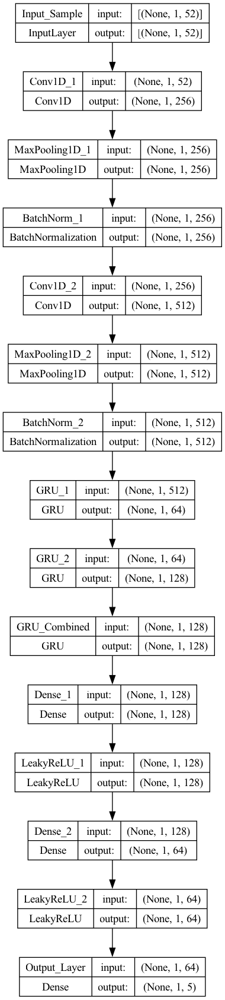

In [176]:
tf.keras.utils.plot_model(gru_model, "gru_model.png", show_shapes=True)

### Model Training

In [333]:
from tensorflow.keras.callbacks import EarlyStopping

In [351]:
cb = [EarlyStopping(patience=25, monitor='val_accuracy', verbose = 1, restore_best_weights=True)]
history = gru_model.fit(x_train_gru, y_train_gru, batch_size=8, epochs=200, verbose=1, validation_data=(x_val_gru, y_val_gru), callbacks = cb)

Epoch 1/200
92/92 [==============================] - 1s 9ms/step - loss: 0.1733 - accuracy: 0.9293 - val_loss: 0.7706 - val_accuracy: 0.7941
Epoch 2/200
92/92 [==============================] - 1s 9ms/step - loss: 0.1704 - accuracy: 0.9361 - val_loss: 1.0088 - val_accuracy: 0.7529
Epoch 3/200
92/92 [==============================] - 1s 8ms/step - loss: 0.2254 - accuracy: 0.9185 - val_loss: 0.5459 - val_accuracy: 0.8118
Epoch 4/200
92/92 [==============================] - 1s 7ms/step - loss: 0.1915 - accuracy: 0.9226 - val_loss: 0.5364 - val_accuracy: 0.8294
Epoch 5/200
92/92 [==============================] - 1s 7ms/step - loss: 0.2237 - accuracy: 0.9239 - val_loss: 0.2926 - val_accuracy: 0.9176
Epoch 6/200
92/92 [==============================] - 1s 7ms/step - loss: 0.2446 - accuracy: 0.9198 - val_loss: 0.6183 - val_accuracy: 0.7941
Epoch 7/200
92/92 [==============================] - 1s 7ms/step - loss: 0.2263 - accuracy: 0.9198 - val_loss: 0.3049 - val_accuracy: 0.9059
Epoch 8/200
9

### Model Evaluation

In [353]:
from sklearn.metrics import confusion_matrix, classification_report

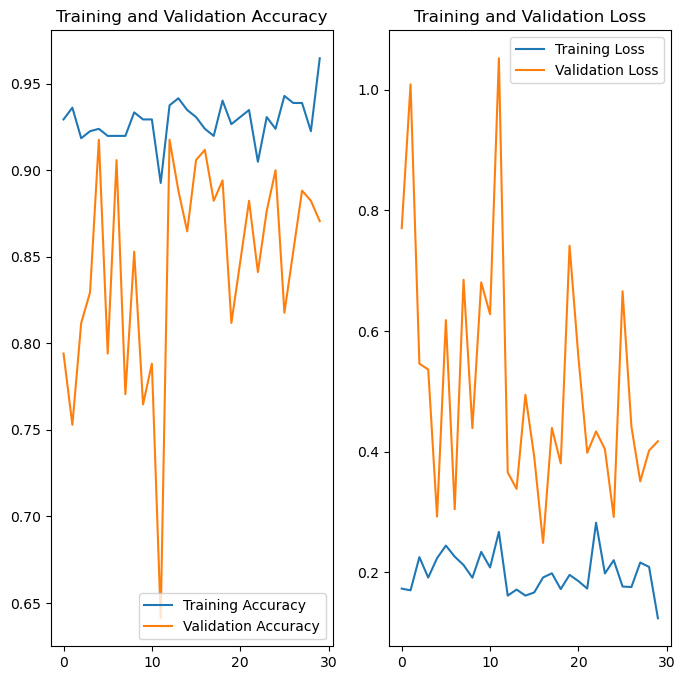

In [354]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

The value of the loss function at a given epoch quantifies the difference between the predicted outputs of the algorithm and the actual target values; in other words, it is the penalty for a incorrect prediction magnified by how incorrect the prediction was.

Accuracy is a metric used to measure how often the model correctly predicts the outcome; Acc = # Correct Predictions / # Total Predictions.

The validation loss and validation accuracy values resulting from applying the model on the testing set indicate that the algorithm is reasonably effective at classifying chest auscultation sounds from the provided categories. 

### Model Testing

2/2 [==============================] - 0s 4ms/step


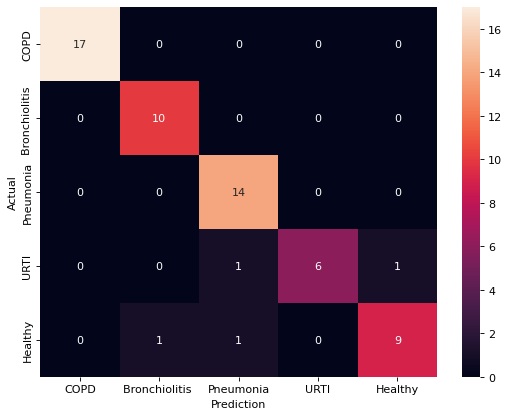

In [359]:
classes = ["COPD" ,"Bronchiolitis ", "Pneumonia", "URTI", "Healthy"]

preds = gru_model.predict(x_test_gru)
classpreds = [np.argmax(t) for t in preds ]
y_testclass = [np.argmax(t) for t in y_test_gru]
cm = confusion_matrix(y_testclass, classpreds)

plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
ax = sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes)

plt.title('')
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.show(ax)

Confusion Matrix: also known as an error matrix, a matrix representation of model testing results allowing for the identification of classes that the algorithm is 'confusing' or misidentifying for another class(es). The confusion matrix here does not suggest any serious issues in the algorithm.

In [369]:
print(classification_report(y_testclass, classpreds, target_names=classes))

                precision    recall  f1-score   support

          COPD       1.00      1.00      1.00        17
Bronchiolitis        0.91      1.00      0.95        10
     Pneumonia       0.88      1.00      0.93        14
          URTI       1.00      0.75      0.86         8
       Healthy       0.90      0.82      0.86        11

      accuracy                           0.93        60
     macro avg       0.94      0.91      0.92        60
  weighted avg       0.94      0.93      0.93        60



Precision: a metric which measures model performance in terms of quality; calculated as the ratio between the number of 'True Positives' and the sum of the number of 'True Positives' and the number of 'False Positives'; a high precision indicates that the model returns more relevant or 'precise' results than irrelevant ones.

Recall: a metric which measures model performance in terms of quantity; calculated as the ratio between the number of 'True Positives' and the sum of the number of 'True Positives' and the number of 'False Negatives'; a high recall indicates that the model returns most of the relevant results, regardless of how many irrelevant results are also returned.

F1-Score: measures predictive model performance by integrating precision and recall into a single metric; calculated as the harmonic mean of the precision and recall scores; ranges from 0 to 1, with 0 indicating poor performance and 1 indicating perfect performance.

Given the high F1-scores overall and a high test accuracy of 93%, along with measures in place to safeguard against overfitting, it can be concluded that the model is effective at classifying lung auscultation samples, with a small margin for improvement. 